## Data Preparation

In [1]:
# rename variable names

import os
import tensorflow as tf
import matplotlib.pyplot as plt
import time
import random

In [2]:
PATH = 'KITTI_unet/'
BUFFER_SIZE = 50
BATCH_SIZE  = 1
IMG_WIDTH   = 1024
IMG_HEIGHT  = 256

def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)    
    
    # resize
    image = tf.image.resize(image, (IMG_HEIGHT, IMG_WIDTH))
    
    # copy
    gray = tf.identity(image)
    color= tf.identity(image)
    
    # convert to gray
    gray = tf.image.rgb_to_grayscale(gray)
    gray = tf.reshape(gray, (1, 256, 1024, 1))

    edges = tf.image.sobel_edges(gray)
    edges = edges**2

    edges = tf.math.reduce_sum(edges,axis=-1)
    edges = tf.sqrt(edges)
    
    edges = tf.cast(edges, tf.float32)
    color = tf.cast(color, tf.float32) 

    return edges[0], color

2023-01-15 13:34:16.590203: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-15 13:34:16.594548: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-15 13:34:16.594662: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-15 13:34:16.615350: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

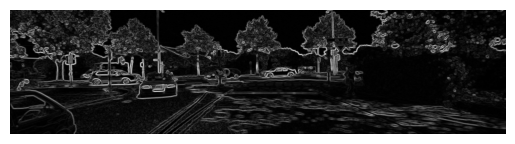

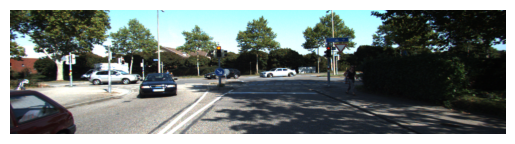

In [3]:
gray, color = load(PATH+'training/000008_10.png')

# casting to int for matplotlib to show the image
plt.figure()
plt.axis('off')
plt.imshow(gray[:,:,0]/255.0, cmap='gray')

plt.figure()
plt.axis('off')
plt.imshow(color/255.0)

In [4]:
# normalizing the images to [-1, 1]
def normalize(gray, color):
    gray  = (gray / 127.5) - 1
    color = (color / 127.5) - 1

    return gray, color

def random_jitter(gray, color):
    if tf.random.uniform(()) > 0.5:
        # random mirroring
        gray  = tf.image.flip_left_right(gray)
        color = tf.image.flip_left_right(color)

    return gray, color

def load_image_train(image_file):
    gray, color = load(image_file)
    gray, color = random_jitter(gray, color)
    gray, color = normalize(gray, color)

    return gray, color

def load_image_test(image_file):
    gray, color = load(image_file)
    gray, color = normalize(gray, color)

    return gray, color

In [5]:
# train_dataset
train_dataset = tf.data.Dataset.list_files(PATH+'training/0000*_10.png')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

# test_dataset
test_dataset = tf.data.Dataset.list_files(PATH+'testing/0000*_10.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

In [6]:
# monitor
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Gray Image', 'True Color Image', 'Predicted Color Image']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        if i==0:
            plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), cmap='gray')        
        else:
            plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

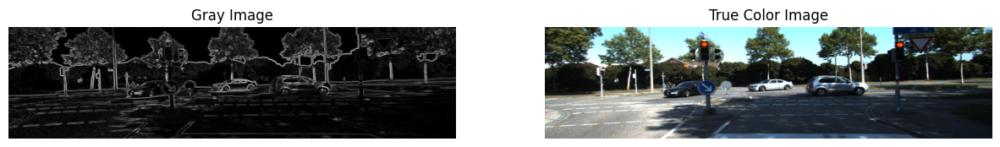

In [7]:
for gray, color in train_dataset.take(1):    
    sample_gray, sample_color = gray[0], color[0]
    display([sample_gray, sample_color])

## Model

In [8]:
inputs = tf.keras.layers.Input(shape=[256, 1024, 1])    
x = inputs  

# block 1
x = tf.keras.layers.Conv2D(64, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

pre1 = x

# block 2
x = tf.keras.layers.Conv2D(128, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

pre2 = x

# block 3
x = tf.keras.layers.Conv2D(256, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

pre3 = x

# block 4
x = tf.keras.layers.Conv2D(512, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

pre4 = x

# block 5
x = tf.keras.layers.Conv2D(512, 4, padding='same', activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPooling2D()(x)

# upsampling
x = tf.keras.layers.Conv2DTranspose(512, 4, padding='same', strides=2, activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Add()([x, pre4])

# upsampling
x = tf.keras.layers.Conv2DTranspose(256, 4, padding='same', strides=2, activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Add()([x, pre3])

# upsampling
x = tf.keras.layers.Conv2DTranspose(128, 4, padding='same', strides=2, activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Add()([x, pre2])

# upsampling
x = tf.keras.layers.Conv2DTranspose(64, 4, padding='same', strides=2, activation='LeakyReLU')(x)
x = tf.keras.layers.BatchNormalization()(x)

x = tf.keras.layers.Add()([x, pre1])

# upsampling
x = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')(x)

model = tf.keras.Model(inputs=[inputs], outputs=[x])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 1024,   0           []                               
                                1)]                                                               
                                                                                                  
 conv2d (Conv2D)                (None, 256, 1024, 6  1088        ['input_1[0][0]']                
                                4)                                                                
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 1024, 6  256        ['conv2d[0][0]']                 
 alization)                     4)                                                            

                                                                                                  
 conv2d_transpose_4 (Conv2DTran  (None, 256, 1024, 3  3075       ['add_3[0][0]']                  
 spose)                         )                                                                 
                                                                                                  
Total params: 13,909,891
Trainable params: 13,905,027
Non-trainable params: 4,864
__________________________________________________________________________________________________


In [9]:
model.predict(sample_gray[tf.newaxis, ...]).shape

(1, 256, 1024, 3)

## Train

In [10]:
model.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError())

def show_predictions(dataset=None, num=1):
    predicted_image = model.predict(sample_gray[tf.newaxis, ...])
    display([sample_gray, sample_color, predicted_image[0]])
        
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):        
        show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/20
100/100 [==============================] - ETA: 0s - loss: 0.3773

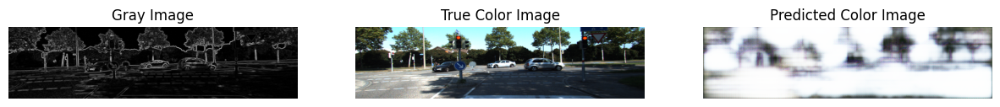


Sample Prediction after epoch 1

100/100 [==============================] - 5s 41ms/step - loss: 0.3773
Epoch 2/20
100/100 [==============================] - ETA: 0s - loss: 0.2587

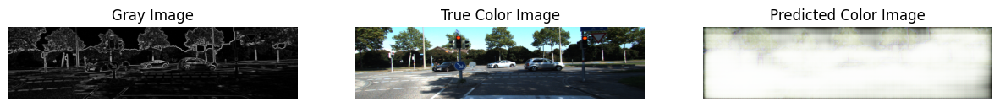


Sample Prediction after epoch 2

100/100 [==============================] - 4s 39ms/step - loss: 0.2587
Epoch 3/20
100/100 [==============================] - ETA: 0s - loss: 0.2324

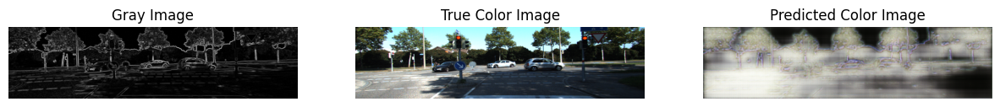


Sample Prediction after epoch 3

100/100 [==============================] - 4s 40ms/step - loss: 0.2324
Epoch 4/20
100/100 [==============================] - ETA: 0s - loss: 0.2031

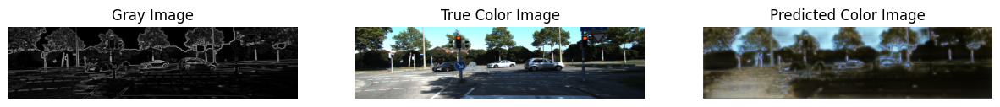


Sample Prediction after epoch 4

100/100 [==============================] - 4s 41ms/step - loss: 0.2031
Epoch 5/20
 99/100 [============================>.] - ETA: 0s - loss: 0.1858

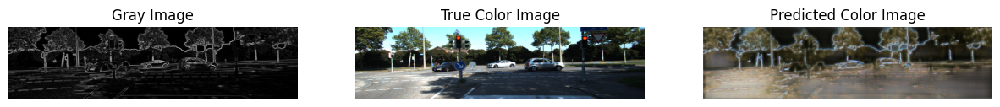


Sample Prediction after epoch 5

100/100 [==============================] - 4s 40ms/step - loss: 0.1849
Epoch 6/20
 99/100 [============================>.] - ETA: 0s - loss: 0.1869

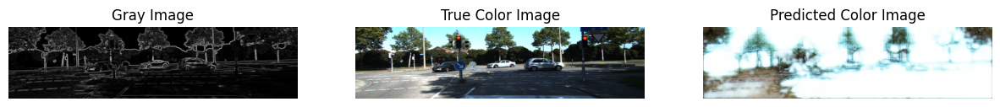


Sample Prediction after epoch 6

100/100 [==============================] - 4s 40ms/step - loss: 0.1866
Epoch 7/20
100/100 [==============================] - ETA: 0s - loss: 0.1766

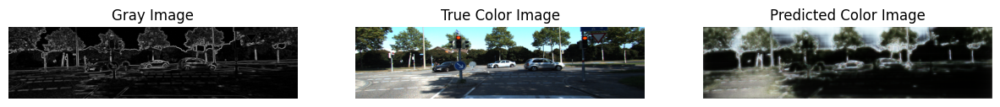


Sample Prediction after epoch 7

100/100 [==============================] - 4s 40ms/step - loss: 0.1766
Epoch 8/20
100/100 [==============================] - ETA: 0s - loss: 0.1640

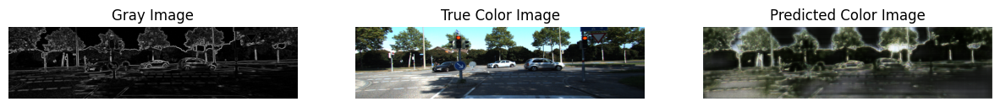


Sample Prediction after epoch 8

100/100 [==============================] - 4s 40ms/step - loss: 0.1640
Epoch 9/20
 99/100 [============================>.] - ETA: 0s - loss: 0.1619

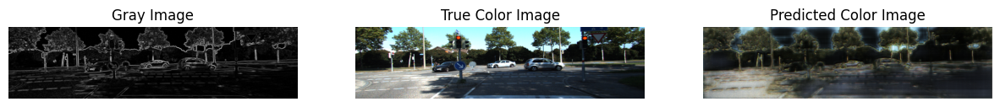


Sample Prediction after epoch 9

100/100 [==============================] - 4s 40ms/step - loss: 0.1621
Epoch 10/20
 99/100 [============================>.] - ETA: 0s - loss: 0.1549

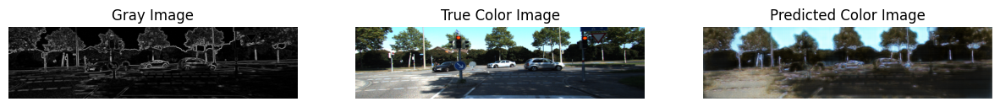


Sample Prediction after epoch 10

100/100 [==============================] - 4s 40ms/step - loss: 0.1543
Epoch 11/20
100/100 [==============================] - ETA: 0s - loss: 0.1426

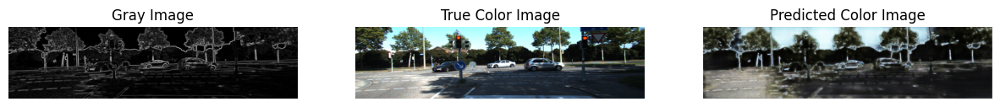


Sample Prediction after epoch 11

100/100 [==============================] - 4s 39ms/step - loss: 0.1426
Epoch 12/20
 99/100 [============================>.] - ETA: 0s - loss: 0.1328

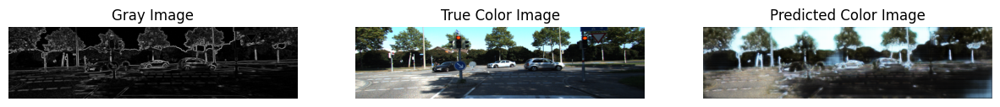


Sample Prediction after epoch 12

100/100 [==============================] - 4s 39ms/step - loss: 0.1325
Epoch 13/20
100/100 [==============================] - ETA: 0s - loss: 0.1366

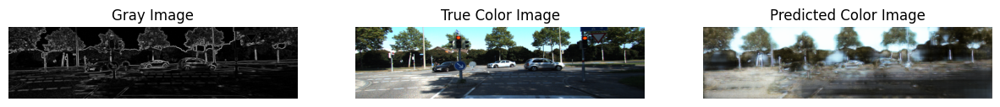


Sample Prediction after epoch 13

100/100 [==============================] - 4s 40ms/step - loss: 0.1366
Epoch 14/20
100/100 [==============================] - ETA: 0s - loss: 0.1292

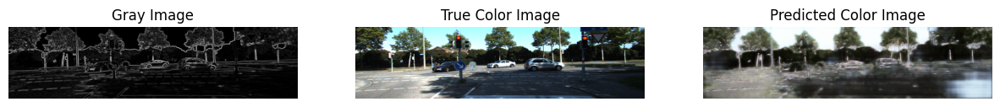


Sample Prediction after epoch 14

100/100 [==============================] - 4s 40ms/step - loss: 0.1292
Epoch 15/20
100/100 [==============================] - ETA: 0s - loss: 0.1177

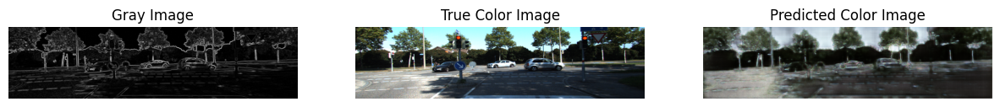


Sample Prediction after epoch 15

100/100 [==============================] - 4s 40ms/step - loss: 0.1177
Epoch 16/20
100/100 [==============================] - ETA: 0s - loss: 0.1113

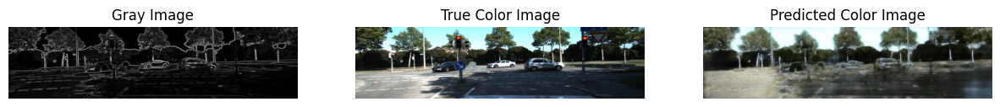


Sample Prediction after epoch 16

100/100 [==============================] - 4s 40ms/step - loss: 0.1113
Epoch 17/20
100/100 [==============================] - ETA: 0s - loss: 0.1104

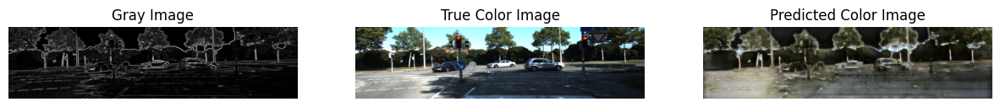


Sample Prediction after epoch 17

100/100 [==============================] - 4s 40ms/step - loss: 0.1104
Epoch 18/20
100/100 [==============================] - ETA: 0s - loss: 0.1200

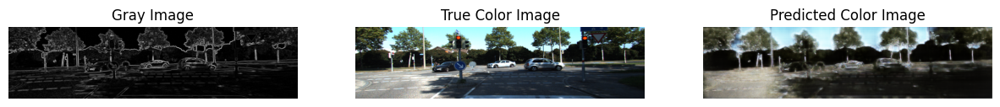


Sample Prediction after epoch 18

100/100 [==============================] - 4s 41ms/step - loss: 0.1200
Epoch 19/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0989

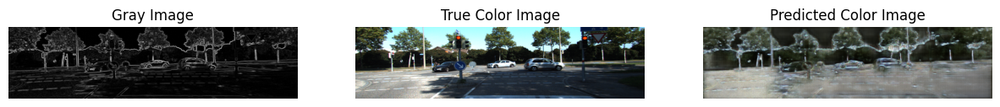


Sample Prediction after epoch 19

100/100 [==============================] - 4s 40ms/step - loss: 0.0990
Epoch 20/20
100/100 [==============================] - ETA: 0s - loss: 0.0958

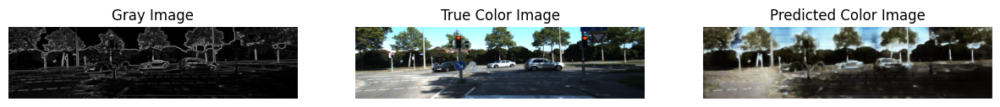


Sample Prediction after epoch 20

100/100 [==============================] - 4s 40ms/step - loss: 0.0958


In [11]:
EPOCHS = 20

model_history = model.fit(train_dataset, epochs=EPOCHS, callbacks=[DisplayCallback()])

Epoch 1/20
 99/100 [============================>.] - ETA: 0s - loss: 0.1005

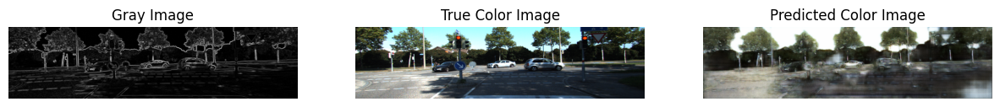


Sample Prediction after epoch 1

100/100 [==============================] - 5s 41ms/step - loss: 0.1001
Epoch 2/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0911

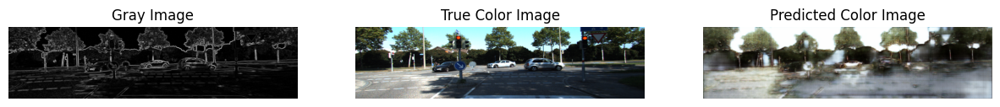


Sample Prediction after epoch 2

100/100 [==============================] - 4s 40ms/step - loss: 0.0912
Epoch 3/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0944

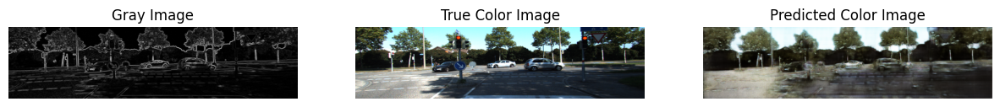


Sample Prediction after epoch 3

100/100 [==============================] - 4s 40ms/step - loss: 0.0945
Epoch 4/20
100/100 [==============================] - ETA: 0s - loss: 0.0828

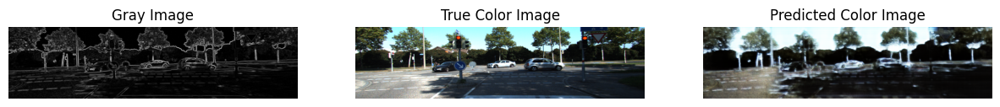


Sample Prediction after epoch 4

100/100 [==============================] - 4s 40ms/step - loss: 0.0828
Epoch 5/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0805

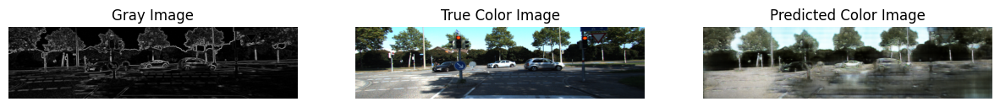


Sample Prediction after epoch 5

100/100 [==============================] - 4s 40ms/step - loss: 0.0809
Epoch 6/20
100/100 [==============================] - ETA: 0s - loss: 0.1065

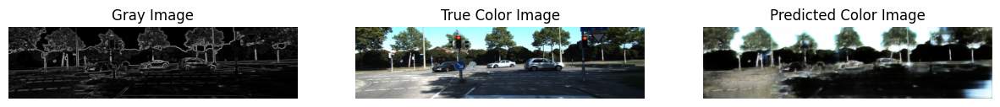


Sample Prediction after epoch 6

100/100 [==============================] - 4s 40ms/step - loss: 0.1065
Epoch 7/20
100/100 [==============================] - ETA: 0s - loss: 0.0826

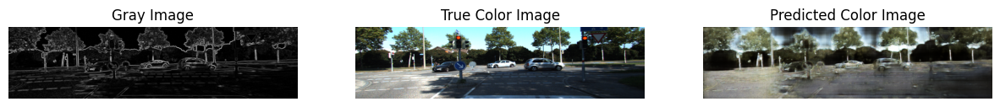


Sample Prediction after epoch 7

100/100 [==============================] - 4s 40ms/step - loss: 0.0826
Epoch 8/20
100/100 [==============================] - ETA: 0s - loss: 0.0720

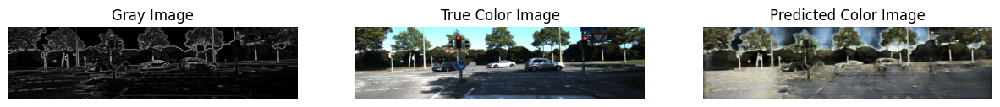


Sample Prediction after epoch 8

100/100 [==============================] - 4s 41ms/step - loss: 0.0720
Epoch 9/20
100/100 [==============================] - ETA: 0s - loss: 0.0695

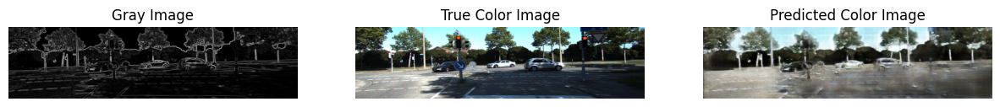


Sample Prediction after epoch 9

100/100 [==============================] - 4s 40ms/step - loss: 0.0695
Epoch 10/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0647

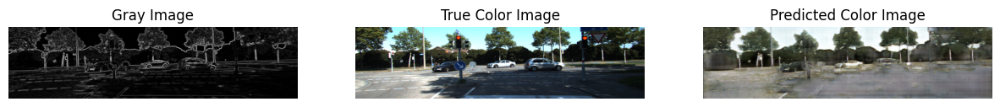


Sample Prediction after epoch 10

100/100 [==============================] - 4s 40ms/step - loss: 0.0648
Epoch 11/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0650

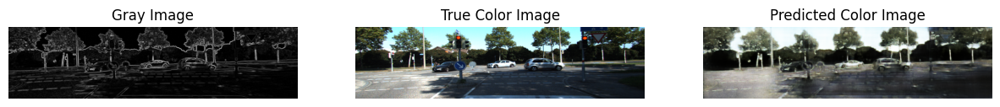


Sample Prediction after epoch 11

100/100 [==============================] - 4s 40ms/step - loss: 0.0650
Epoch 12/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0647

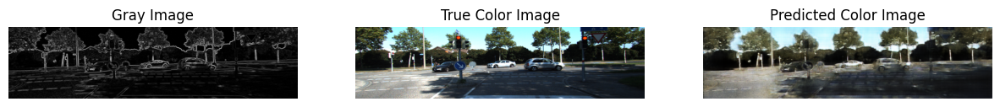


Sample Prediction after epoch 12

100/100 [==============================] - 4s 40ms/step - loss: 0.0646
Epoch 13/20
100/100 [==============================] - ETA: 0s - loss: 0.0628

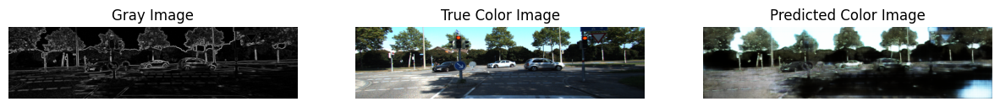


Sample Prediction after epoch 13

100/100 [==============================] - 4s 39ms/step - loss: 0.0628
Epoch 14/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0612

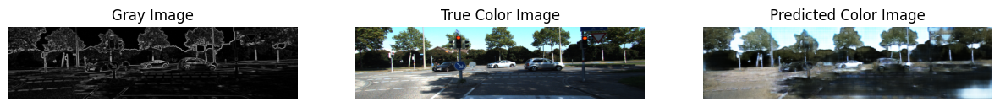


Sample Prediction after epoch 14

100/100 [==============================] - 4s 40ms/step - loss: 0.0612
Epoch 15/20
100/100 [==============================] - ETA: 0s - loss: 0.0550

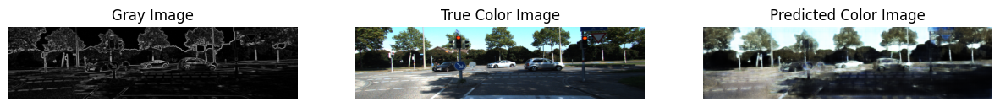


Sample Prediction after epoch 15

100/100 [==============================] - 4s 40ms/step - loss: 0.0550
Epoch 16/20
 99/100 [============================>.] - ETA: 0s - loss: 0.0531

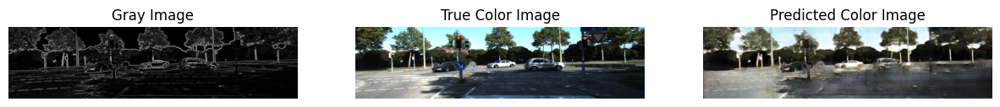


Sample Prediction after epoch 16

100/100 [==============================] - 4s 40ms/step - loss: 0.0531
Epoch 17/20
100/100 [==============================] - ETA: 0s - loss: 0.0519

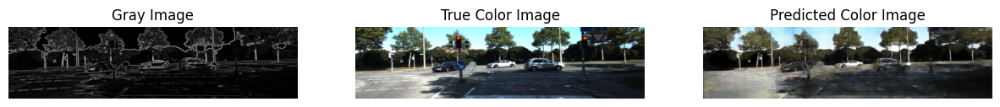


Sample Prediction after epoch 17

100/100 [==============================] - 4s 40ms/step - loss: 0.0519
Epoch 18/20
100/100 [==============================] - ETA: 0s - loss: 0.0500

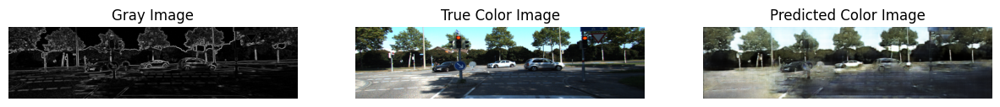


Sample Prediction after epoch 18

100/100 [==============================] - 4s 39ms/step - loss: 0.0500
Epoch 19/20
100/100 [==============================] - ETA: 0s - loss: 0.0474

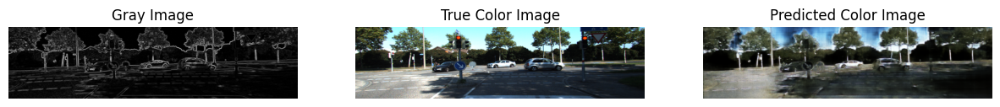


Sample Prediction after epoch 19

100/100 [==============================] - 4s 40ms/step - loss: 0.0474
Epoch 20/20
100/100 [==============================] - ETA: 0s - loss: 0.0473

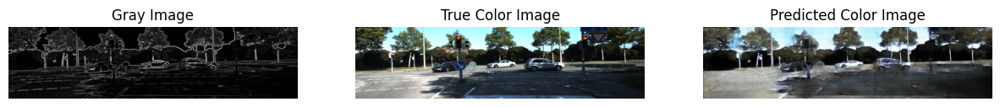


Sample Prediction after epoch 20

100/100 [==============================] - 4s 40ms/step - loss: 0.0473


In [12]:
tf.keras.optimizers.Adam(learning_rate=0.00001)
model.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError())

EPOCHS = 20

model_history = model.fit(train_dataset, epochs=EPOCHS, callbacks=[DisplayCallback()])

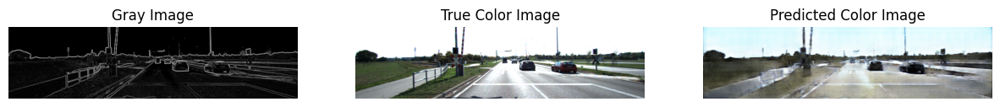

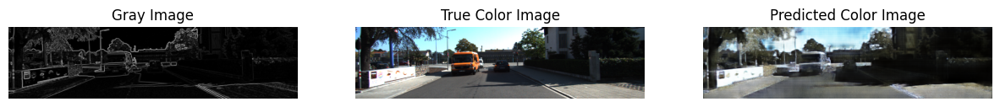

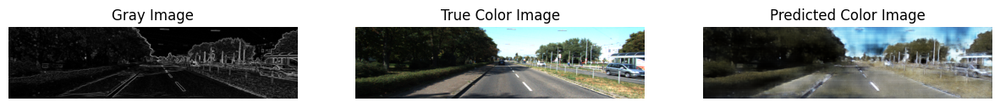

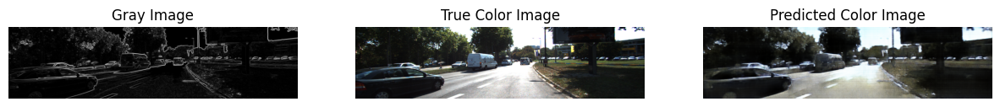

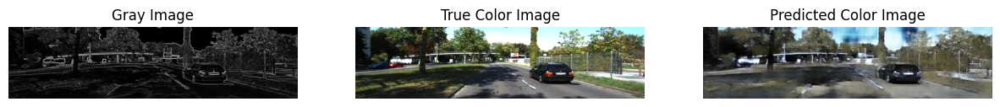

In [13]:
for gray_image, color_image in train_dataset.take(5):
    predicted_image = model.predict(gray_image)
    display([gray_image[0], color_image[0], predicted_image[0]])

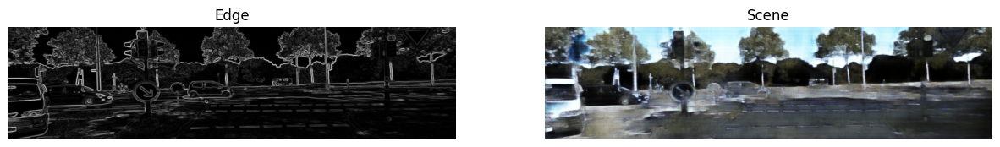

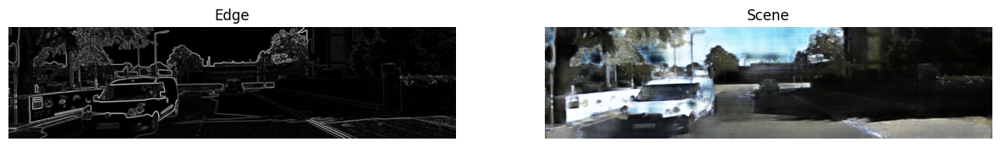

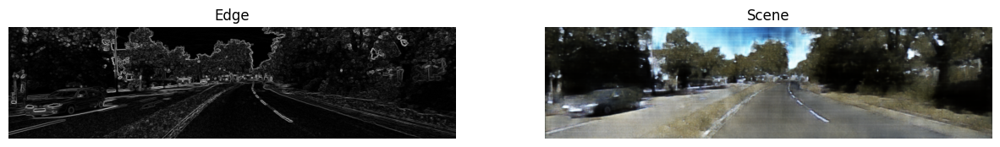

In [18]:
# monitor
def display2(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Edge', 'Scene']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        if i==0:
            plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), cmap='gray')        
        else:
            plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
            
        plt.axis('off')
    plt.show()

for edge, _ in test_dataset.take(5):
    predicted_scene = model.predict(edge)
    display2([edge[0], predicted_scene[0]])